In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyyaml==5.1
import torch

TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 274.2/274.2 kB 17.7 MB/s eta 0:00:00
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.
torch:  2.5 ; cuda:  cu121
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-tvdyediv
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-tvdyediv
  Resolved https://github.com/facebookresearch/detectron2.git to commit c69939aa85460e8135f40bce908a6cddaa73065f
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━

In [ ]:
#some basic setup
#setup detectron2 logger

import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2,os,json,random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [ ]:
%cd '/content/drive/MyDrive/detectron2'

/content/drive/MyDrive/detectron2


In [ ]:
!pwd

/content/drive/MyDrive/detectron2


In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("sample", {}, "/content/drive/MyDrive/detectron2/data/trainval.json", "/content/drive/MyDrive/detectron2/data/images")

In [ ]:
sample_metadata = MetadataCatalog.get("sample")
dataset_dicts = DatasetCatalog.get("sample")

WARNING [12/06 17:06:48 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/06 17:06:48 d2.data.datasets.coco]: Loaded 51 images in COCO format from /content/drive/MyDrive/detectron2/data/trainval.json


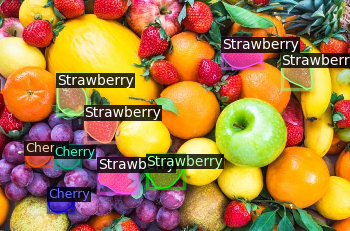

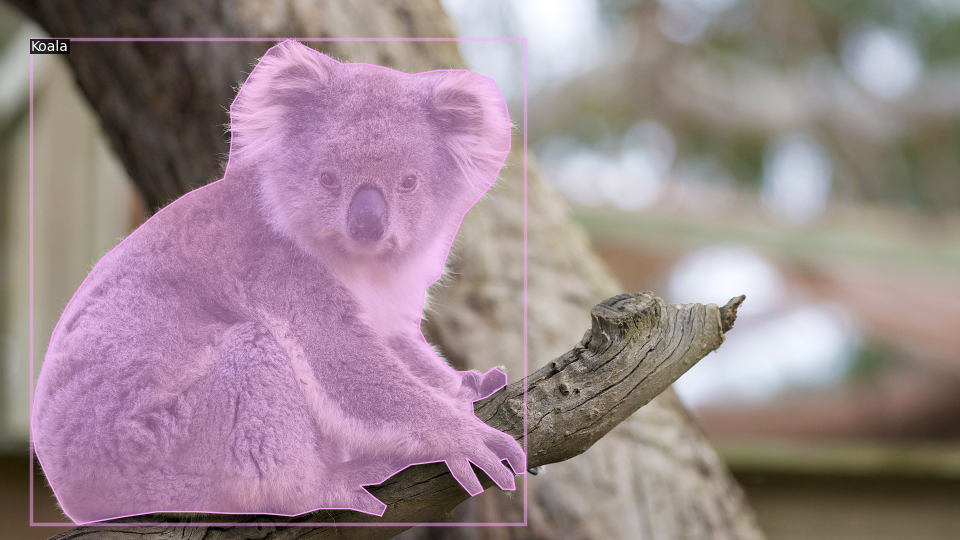

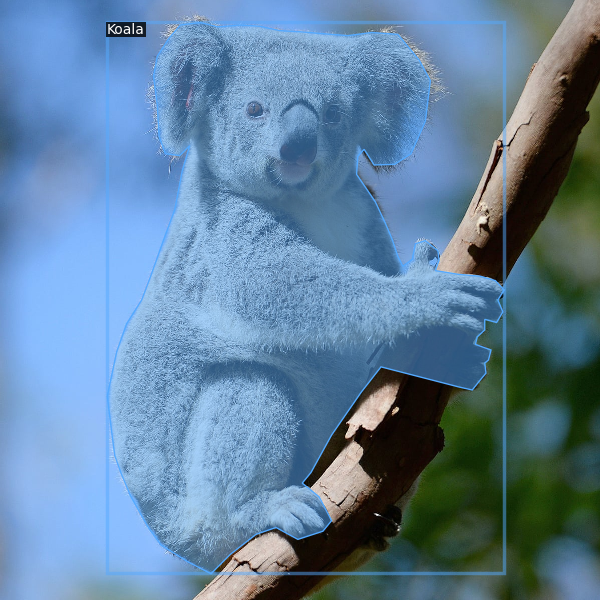

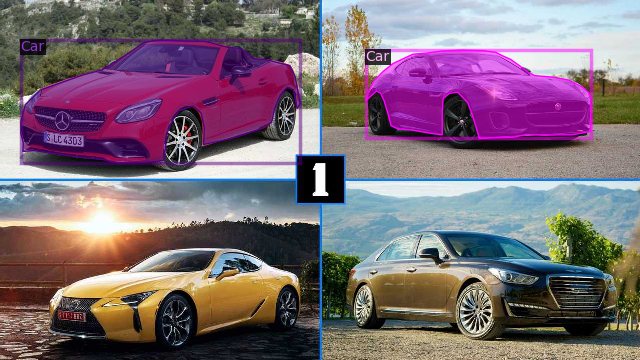

In [ ]:
import random
for d in random.sample(dataset_dicts, 4):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=sample_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("sample",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0025  # pick a good LR
cfg.SOLVER.MAX_ITER = 300    # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 14  # (see https://detectron2.readthedocs.io/tutorials/datasets.html#update-the-config-for-new-datasets)
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[12/06 17:13:34 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:00, 264MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[12/06 17:13:35 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.10/dist-packages/torch/functional.py:534: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at ../aten/src/ATen/native/TensorShape.cpp:3595.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[12/06 17:13:56 d2.utils.events]:  eta: 0:03:37  iter: 19  total_loss: 3.829  loss_cls: 2.459  loss_box_reg: 0.5835  loss_mask: 0.6907  loss_rpn_cls: 0.03469  loss_rpn_loc: 0.009442    time: 0.7913  last_time: 0.5153  data_time: 0.3643  last_data_time: 0.0039   lr: 0.00016068  max_mem: 2581M
[12/06 17:14:09 d2.utils.events]:  eta: 0:02:16  iter: 39  total_loss: 2.187  loss_cls: 0.9475  loss_box_reg: 0.5618  loss_mask: 0.6479  loss_rpn_cls: 0.03404  loss_rpn_loc: 0.01297    time: 0.6304  last_time: 0.4450  data_time: 0.0237  last_data_time: 0.0059   lr: 0.00032718  max_mem: 2617M
[12/06 17:14:19 d2.utils.events]:  eta: 0:02:03  iter: 59  total_loss: 1.895  loss_cls: 0.6998  loss_box_reg: 0.6003  loss_mask: 0.5268  loss_rpn_cls: 0.0133  loss_rpn_loc: 0.01039    time: 0.5830  last_time: 0.5117  data_time: 0.0181  last_data_time: 0.0054   lr: 0.00049367  max_mem: 2672M
[12/06 17:14:28 d2.utils.events]:  eta: 0:01:51  iter: 79  total_loss: 1.764  loss_cls: 0.6216  loss_box_reg: 0.6508  loss

In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
cfg.DATASETS.TEST = ("sample", )
predictor = DefaultPredictor(cfg)

[12/06 17:19:24 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from ./output/model_final.pth ...


/usr/local/lib/python3.10/dist-packages/fvcore/common/checkpoint.py:252: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return torch.load(f, map_location=torch.device("cpu"))

In [ ]:
%pwd

'/content/drive/MyDrive/detectron2'

In [ ]:
from detectron2.utils.visualizer import ColorMode
import os

data_path = "/content/drive/MyDrive/detectron2/test_data/" # Add trailing slash

for d in os.listdir("test_data"):
    image_path = os.path.join(data_path, d) # Use os.path.join to create a valid path
    im = cv2.imread(image_path)
    if im is not None: # Check if image was loaded successfully
        outputs = predictor(im)
        v = Visualizer(im[:, :, ::-1],
                       metadata=sample_metadata,
                       scale=0.8,
                       instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
        )
        v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
        cv2_imshow(v.get_image()[:, :, ::-1])
    else:
        print(f"Could not load image: {image_path}") # Print an error message if loading fails

Could not load image: /content/drive/MyDrive/detectron2/test_data/.ipynb_checkpoints
Could not load image: /content/drive/MyDrive/detectron2/test_data/Copy of 30_07_2018-helmateddn_18257838_9831516.jpg
Could not load image: /content/drive/MyDrive/detectron2/test_data/Copy of 1.jpg
Could not load image: /content/drive/MyDrive/detectron2/test_data/Copy of 3451e49fa7e5f3584138c4cbb983112e.jpg


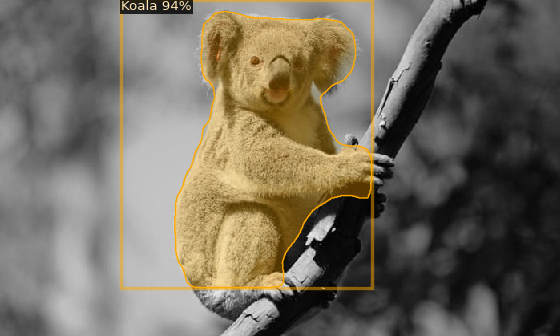

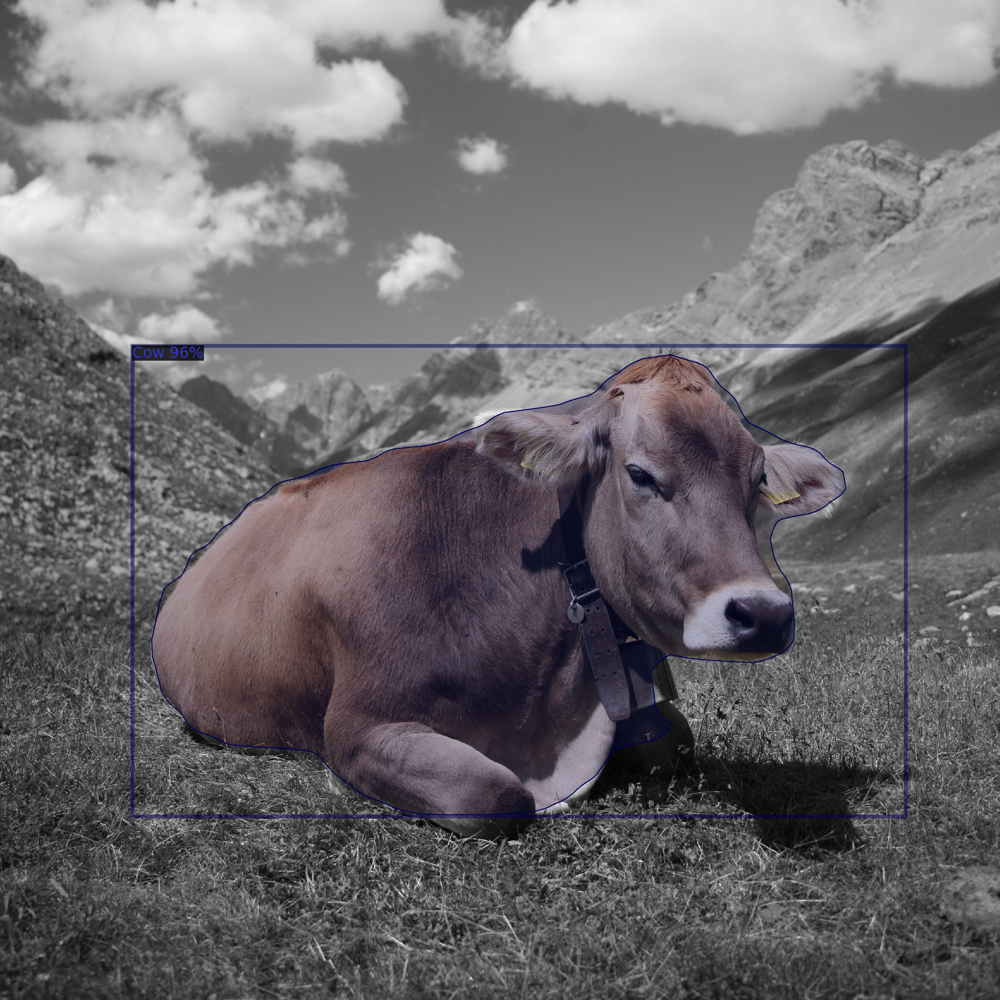

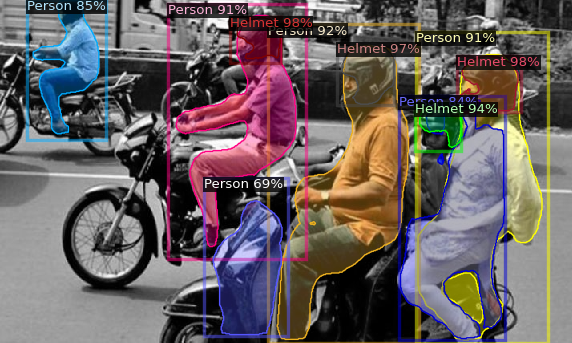

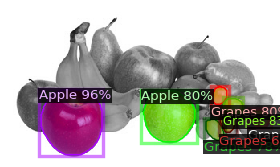

In [ ]:
from detectron2.utils.visualizer import ColorMode

for d in random.sample(dataset_dicts, 4):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=sample_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(v.get_image()[:, :, ::-1])

# Evaluation

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("sample", output_dir= "./output")
val_loader = build_detection_test_loader(cfg, "sample")
print(inference_on_dataset(predictor.model, val_loader, evaluator))

WARNING [12/06 17:32:22 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[12/06 17:32:22 d2.data.datasets.coco]: Loaded 51 images in COCO format from /content/drive/MyDrive/detectron2/data/trainval.json
[12/06 17:32:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/06 17:32:22 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[12/06 17:32:22 d2.data.common]: Serializing 51 elements to byte tensors and concatenating them all ...
[12/06 17:32:22 d2.data.common]: Serialized dataset takes 0.13 MiB
[12/06 17:32:22 d2.evaluation.evaluator]: Start inference on 51 batches
[12/06 17:32:23 d2.evaluation.evaluator]: Inference done 11/51. Dataloading: 0.0016 s/iter. Inference: 0.1124 s/iter. Eval: 0.0024 s/iter. Total: 0.1165 s/iter. ETA=0:00:04
[12/06 17:32:29 d2.

# Getting Custom Config File

In [ ]:
pwd

'/content/drive/MyDrive/detectron2'

In [ ]:
f = open('config.yml', 'w')
f.write(cfg.dump())
f.close()